### Cat Localization
#### benchmarking https://www.youtube.com/watch?v=GSwYGkTfOKk&list=PLkDaE6sCZn6Gl29AoE31iwdVwSG-KnDzF&index=23

In [3]:
# 필요한 패키지들
import cv2, os
from glob import glob
import numpy as np
import tensorflow as tf

In [80]:
# labelling cat location of cat images from 'cat and dog images' from kaggle (https://www.kaggle.com/tongpython/cat-and-dog?)
# using labelImg
# hand label 200

cat_img = glob('../Downloads/cat_location/*.jpg')

##### proposal
- x[img] -> y label 로직을 가진 이미지 분류에서
 x[img] -> y label + cat_location으로 변환. (심화버전 whether cat is in the image or not 0/1 추가)

##### problems to solve
1. 이미지 사이즈들이 다 달라서 모델 인풋 전에 resize가 필요한데, xml cat_location 위치도 맞춰서 변환 필요.
2. 라벨에 대한 loss function과 location에 대한 loss function이 같아도 되는 것인지. (동영상에 따르면 문제 없음)



In [44]:
# xml 처리 패키지 xml.etree.ElementTree
from xml.etree import ElementTree as ET
## annotation 내에 size와 bndbox
root = ET.parse(cat_xml[0]).getroot()


for t in root.find('size'):
    print(t)
    
for b in root.find('object/bndbox') :
    print(b.text)
    
x,y,z = root.find('size')

print(x.text,y.text,z.text)

<Element 'width' at 0x000001AFDD8CA458>
<Element 'height' at 0x000001AFDEB78BD8>
<Element 'depth' at 0x000001AFDEB78958>
43
36
297
280
300 280 3


In [55]:
cat_img[1].split('\\')[-1].split('.')[0]

'cat'

In [84]:
# get coordinate from xml file
def get_y(filename) :
    
    assert filename.split('.')[-1] == 'jpg'
    
    # resize image (224,224) if not.
    
    xml = filename.replace('.jpg', '.xml')
    
    if os.path.isfile(xml) :
        
        root = ET.parse(xml).getroot()
        width, height, _ = root.find('size')
        
        
        ratio_x, ratio_y = 224/ int(width.text), 224/ int(height.text)
        
        x_min,y_min,x_max,y_max = root.find('object/bndbox')
        
        return np.array([ratio_x*int(x_min.text), ratio_y*int(y_min.text), ratio_x*int(x_max.text), ratio_y*int(y_max.text)])
    
    else : print('not a file')
        
# load and preprocess image

def get_image(filename) :
    
    img = cv2.imread(filename)
    img = cv2.resize(img,(224,224))/255.0
    
    return img
    

In [85]:
# sample xml output
get_y('../Downloads\cat_location\cat.79.jpg')

array([ 18.40480962,   4.53179191, 224.        , 216.87861272])

In [86]:
# get image output
x = np.array([get_image(img) for img in cat_img])
y = np.array([get_y(file) for file in cat_img])


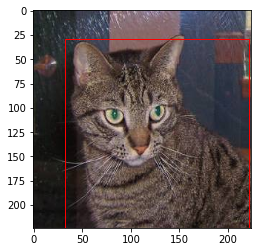

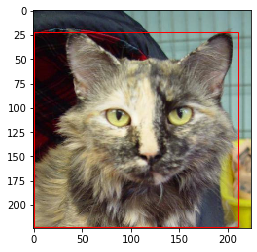

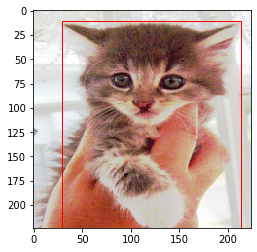

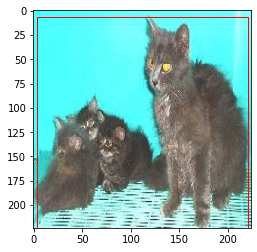

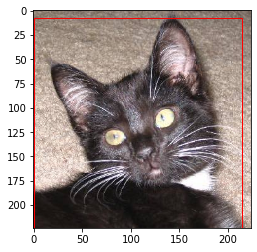

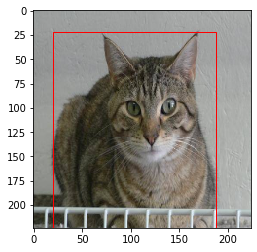

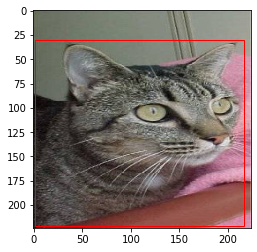

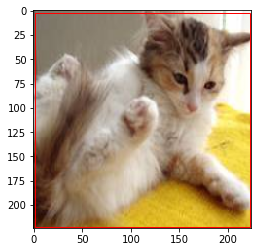

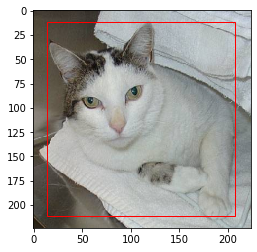

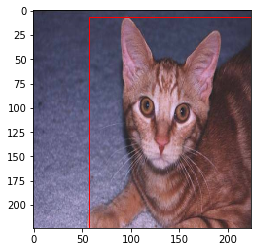

In [100]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def visualize_box(img, xml) :
    img = img[:,:,::-1] # cv2랑 plt 읽는 법 다름. cv2 : bgr, plt : rgb
    plt.imshow(img)
    plt.gca().add_patch(Rectangle((xml[0], xml[1]), xml[2]-xml[0], xml[3]-xml[1], linewidth=1, edgecolor='r', facecolor='none'))
    plt.show()

    
for samp_img, samp_xml in zip(x[:10],y[:10]) :    
    visualize_box(samp_img, samp_xml)

In [112]:
# build a model

from tensorflow.keras.layers import Dense, MaxPool2D, BatchNormalization, Activation, Conv2D, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Input
from tensorflow.keras.models import Model

def build_model() :
    
    inp = Input((224,224,3))
    
    # Conv2D 
    x = Conv2D(64, 7, padding='same')(inp)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(128, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(64, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Conv2D(32, 5, padding='same')(x)
    x = Activation('relu')(x)
    x = MaxPool2D(3)(x)
    x = BatchNormalization()(x)
    
    x = Flatten()(x)
    x = Dense(64)(x)
    x = Activation('relu')(x)
    x = Dropout(0.3)(x)
    output = Dense(4, 'softmax')(x)
    
    model = Model(inputs=inp,outputs=output)
    
    return model
    
    
    

In [114]:
adam = Adam()

model = build_model()


In [116]:
model.compile(loss='mse', optimizer = adam, metrics =['accuracy'])

In [117]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 224, 224, 64)      9472      
_________________________________________________________________
activation_24 (Activation)   (None, 224, 224, 64)      0         
_________________________________________________________________
max_pooling2d_20 (MaxPooling (None, 74, 74, 64)        0         
_________________________________________________________________
batch_normalization_20 (Batc (None, 74, 74, 64)        256       
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 74, 74, 128)       204928    
_________________________________________________________________
activation_25 (Activation)   (None, 74, 74, 128)       0   

In [123]:
model.fit(x,y, batch_size = 32, epochs = 50)

Train on 200 samples
Epoch 1/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3267 - accuracy: 0.7350
Epoch 2/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3245 - accuracy: 0.7450
Epoch 3/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3511 - accuracy: 0.7200
Epoch 4/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3258 - accuracy: 0.7400
Epoch 5/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3606 - accuracy: 0.7300
Epoch 6/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3232 - accuracy: 0.7300
Epoch 7/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3250 - accuracy: 0.7450
Epoch 8/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3281 - accuracy: 0.7400
Epoch 9/50
200/200 [==============================] - 0s 2ms/sample - loss: 21979.3165 - accuracy: 0.7550
Epoch 10/50
200/200 [====

In [127]:
#test image

test_cats = glob('../Downloads/cat_location_test/*.jpg')
len(test_cats)

test_x = np.array([get_image(x) for x in test_cats])

In [129]:
prediction = model.predict(test_x)

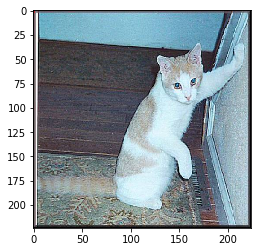

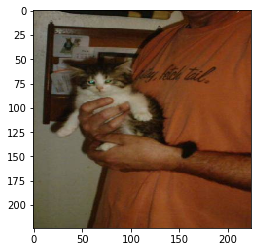

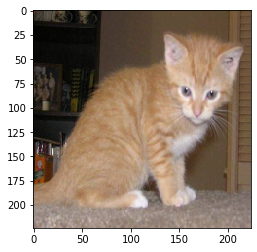

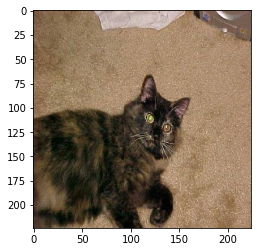

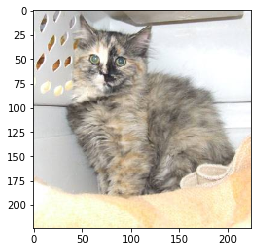

...

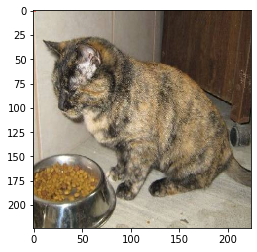

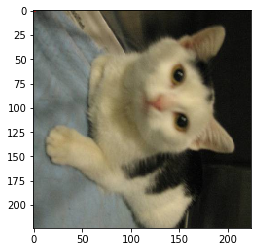

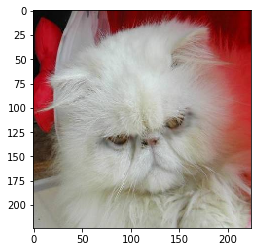

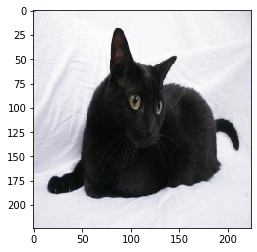

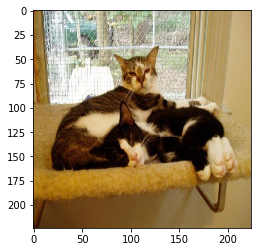

In [130]:
for img, xml in zip(test_x, prediction) :
    visualize_box(img, xml)

In [131]:
prediction

array([[1.28288830e-05, 1.11080544e-05, 5.55595895e-03, 9.94420111e-01],
       [1.49263360e-03, 4.71361214e-04, 5.51070571e-01, 4.46965426e-01],
       [3.47237547e-05, 1.93651649e-05, 4.35150898e-04, 9.99510765e-01],
       [2.20577667e-09, 8.54762428e-10, 4.93030550e-09, 1.00000000e+00],
       [9.42212006e-04, 1.62633063e-04, 6.60388887e-01, 3.38506281e-01],
       [9.32484818e-06, 6.66990672e-05, 2.41619095e-01, 7.58304834e-01],
       [4.01362826e-07, 3.29512062e-08, 2.20105775e-07, 9.99999285e-01],
       [3.81291495e-03, 1.73858111e-03, 5.19410908e-01, 4.75037545e-01],
       [1.98038248e-03, 4.56795358e-04, 4.20771074e-03, 9.93355155e-01],
       [6.80779631e-04, 6.75933494e-04, 9.88330603e-01, 1.03127733e-02],
       [6.46284534e-05, 1.41549477e-04, 9.17325616e-01, 8.24682266e-02],
       [3.71699971e-05, 2.22392380e-04, 7.42936358e-02, 9.25446808e-01],
       [6.47314937e-06, 3.22893629e-06, 6.99107068e-06, 9.99983311e-01],
       [1.52354210e-06, 4.32601018e-06, 1.71129927e